# Object Detection Model

- Classes
    1: 'person'
    2: 'bicycle'
    3: 'car'
    4: 'motorcycle'
    5: 'airplane'
    6: 'bus'
    7: 'train'
    8: 'truck'
    9: 'boat'
    10: 'traffic light'
    11: 'fire hydrant'
    13: 'stop sign'
    14: 'parking meter'
    15: 'bench'
    16: 'bird'
    17: 'cat'
    18: 'dog'
    19: 'horse'
    20: 'sheep'
    21: 'cow'
    22: 'elephant'
    23: 'bear'
    24: 'zebra'
    25: 'giraffe'
    27: 'backpack'
    28: 'umbrella'
    31: 'handbag'
    32: 'tie'
    33: 'suitcase'
    34: 'frisbee'
    35: 'skis'
    36: 'snowboard'
    37: 'sports ball'
    38: 'kite'
    39: 'baseball bat'
    40: 'baseball glove'
    41: 'skateboard'
    42: 'surfboard'
    43: 'tennis racket'
    44: 'bottle'
    46: 'wine glass'
    47: 'cup'
    48: 'fork'
    49: 'knife'
    50: 'spoon'
    51: 'bowl'
    52: 'banana'
    53: 'apple'
    54: 'sandwich'
    55: 'orange'
    56: 'broccoli'
    57: 'carrot'
    58: 'hot dog'
    59: 'pizza'
    60: 'donut'
    61: 'cake'
    62: 'chair'
    63: 'couch'
    64: 'potted plant'
    65: 'bed'
    67: 'dining table'
    70: 'toilet'
    72: 'tv'
    73: 'laptop'
    74: 'mouse'
    75: 'remote'
    76: 'keyboard'
    77: 'cell phone'
    78: 'microwave'
    79: 'oven'
    80: 'toaster'
    81: 'sink'
    82: 'refrigerator'
    84: 'book'
    85: 'clock'
    86: 'vase'
    87: 'scissors'
    88: 'teddy bear'
    89: 'hair drier'
    90: 'toothbrush'


In [46]:
import tensorflow as tf
import urllib.request
import cv2
import numpy as np
import os
import shutil


from matplotlib import pyplot as plt

# Download the model files to a local directory
# model_url = "https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2?tf-hub-format=compressed"
# os.makedirs(model_dir, exist_ok=True)
# urllib.request.urlretrieve(model_url, os.path.join(model_dir, "model.tar.gz"))
# shutil.unpack_archive(os.path.join(model_dir, "model.tar.gz"), model_dir)

model_dir = "ssd_mobilenet_v2_2"

# Load model
model = tf.saved_model.load(model_dir)


In [2]:

# Load the image
image_path = "\image_data\me.jpg"
image = cv2.imread(image_path)


# Reshape the image to match the model input shape
image = cv2.resize(image, (640, 640))

# Convert the image to a tensor
image_tensor = tf.convert_to_tensor(image)

# Add a batch dimension to the tensor
image_tensor = tf.expand_dims(image_tensor, 0)

# Run the image through the model
detections = model(image_tensor)

# Get the detected boxes, scores, and classes
boxes = detections['detection_boxes'][0].numpy()
scores = detections['detection_scores'][0].numpy()
classes = detections['detection_classes'][0].numpy().astype(np.uint32)

# Extract the building boxes and scores
building_boxes = boxes[classes >= 0]
building_scores = scores[classes >= 0]
building_classes = classes[classes >= 0]


print("Detected objects:")
box_list = []
for box, score,class_ in zip(building_boxes, building_scores,building_classes):
    ymin, xmin, ymax, xmax = box
    x, y, w, h = int(xmin*image.shape[1]), int(ymin*image.shape[0]), int((xmax-xmin)*image.shape[1]), int((ymax-ymin)*image.shape[0])
    if score>0.47:
        print(f"({x}, {y}), ({x+w}, {y+h}), score={score}, class={class_}")
        box_list.append((x, y, x+w, y+h))


Detected objects:
(112, 217), (554, 637), score=0.6057589054107666, class=1
(454, 331), (542, 462), score=0.4997168779373169, class=53


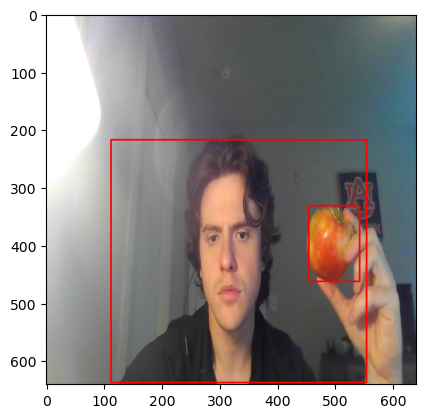

In [3]:

# Define the bounding boxes
boxes = box_list 

# Draw the bounding boxes on the image
for box in boxes:
    x1, y1, x2, y2 = box
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), thickness=2)



# BGR to RGB
img_disp = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display 
plt.imshow(img_disp)
plt.show()

# Videos to images
 - Reading the video data and converting to images

In [152]:

# Set the video file path
video_path = "\image_data\traffic.mp4"

# Set the output directory path
output_dir = "\video_data"

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Open the video file
cap = cv2.VideoCapture(video_path)

# Initialize frame counter
frame_count = 0

# Set the time interval between frame captures (in milliseconds)
time_interval = 3000

# Set the initial time (in milliseconds)
current_time = 0

# Loop through the video 
while cap.isOpened():
    ret, frame = cap.read()

    # If read successfully
    if ret:
        # If the current time is greater than the time interval, capture the frame
        if current_time >= time_interval:

            output_path = os.path.join(output_dir, 'frame{:06d}.jpg'.format(frame_count))
            cv2.imwrite(output_path, frame)

            # Increment the frame counter
            frame_count += 1
            # Reset the current time
            current_time = 0

        # Increment the current time
        current_time += cap.get(cv2.CAP_PROP_POS_MSEC)

        # Wait for the specified time interval before capturing the next frame
        cv2.waitKey(time_interval)
    else:
        break

        
cap.release()


In [147]:
def print_frame_and_bbox(image_path):
    image = cv2.imread(image_path)

    # Convert to RGB format
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reshape the image to match the model input shape
    image = cv2.resize(image, (640, 640))


    
    # Convert the image to a tensor
    image_tensor = tf.convert_to_tensor(image)

    # Add a batch dimension to the tensor
    image_tensor = tf.expand_dims(image_tensor, 0)

    # Run the image through the model
    detections = model(image_tensor)

    # Get the detected boxes, scores, and classes
    boxes = detections['detection_boxes'][0].numpy()
    scores = detections['detection_scores'][0].numpy()
    classes = detections['detection_classes'][0].numpy().astype(np.uint32)

    # Extract the building boxes and scores for cars only
    building_boxes = boxes[classes == 3]
    building_scores = scores[classes == 3]
    building_classes = classes[classes == 3]



    print("Detected objects:")
    box_list = []
    for box, score,class_ in zip(building_boxes, building_scores,building_classes):
        ymin, xmin, ymax, xmax = box
        x, y, w, h = int(xmin*image.shape[1]), int(ymin*image.shape[0]), int((xmax-xmin)*image.shape[1]), int((ymax-ymin)*image.shape[0])
        
        if score>0.2:
#             print(class_)
            print(f"({x}, {y}), ({x+w}, {y+h}), score={score}, class={class_}")
            box_list.append((x, y, x+w, y+h))






    # Define the bounding boxes
    boxes = box_list

    # Draw the bounding boxes on the image
    for box in boxes:
        x1, y1, x2, y2 = box
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), thickness=2)



    img_disp = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display image with matplotlib
    plt.imshow(img_disp)
    plt.show()

In [148]:
# Get all frames of video
def get_files_in_folder(folder_path):
    path_list = []
    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            file_path_raw = r"{}".format(file_path)
            path_list.append(file_path_raw)
    
    return path_list

# Specify the folder path
folder_path = "\video_data"

# Call the function to print file paths
all_frames_paths = get_files_in_folder(folder_path)


Detected objects:
(545, 27), (566, 49), score=0.5145832896232605, class=3
(349, 86), (359, 103), score=0.37056800723075867, class=3
(423, 3), (438, 15), score=0.3646506667137146, class=3
(353, 49), (360, 63), score=0.35088714957237244, class=3
(333, 50), (339, 63), score=0.33268943428993225, class=3
(373, 78), (391, 105), score=0.3165757954120636, class=3
(437, 2), (456, 16), score=0.29035407304763794, class=3
(531, 28), (542, 47), score=0.2747028172016144, class=3
(340, 97), (360, 121), score=0.25368472933769226, class=3
(322, 17), (331, 28), score=0.2509825825691223, class=3
(532, 23), (543, 45), score=0.2487439662218094, class=3
(381, 38), (391, 61), score=0.24658100306987762, class=3
(368, 16), (374, 27), score=0.23262183368206024, class=3
(558, 25), (620, 54), score=0.22454413771629333, class=3
(382, 10), (391, 22), score=0.21357831358909607, class=3


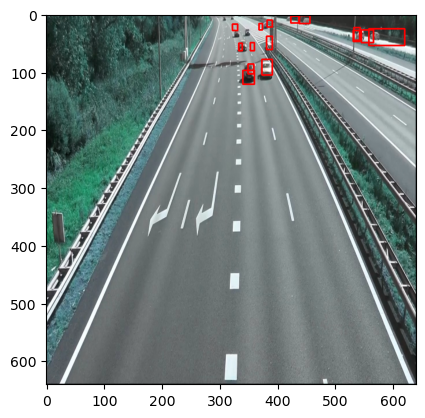

Detected objects:
(349, 51), (358, 64), score=0.3804928958415985, class=3
(421, 4), (438, 15), score=0.37301120162010193, class=3
(341, 105), (363, 136), score=0.3637003004550934, class=3
(548, 25), (571, 44), score=0.3631422221660614, class=3
(335, 53), (341, 66), score=0.35260722041130066, class=3
(373, 100), (397, 128), score=0.255185604095459, class=3
(434, 2), (460, 15), score=0.25127142667770386, class=3
(521, 24), (535, 45), score=0.24899990856647491, class=3
(351, 83), (360, 97), score=0.22459948062896729, class=3
(386, 9), (395, 22), score=0.2086014598608017, class=3


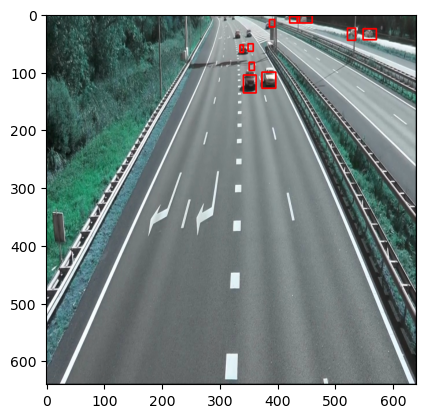

Detected objects:
(417, 0), (442, 12), score=0.39877161383628845, class=3
(543, 21), (571, 43), score=0.3673268258571625, class=3
(376, 107), (403, 142), score=0.36233600974082947, class=3
(517, 20), (532, 40), score=0.3617701530456543, class=3
(347, 52), (358, 68), score=0.3406066298484802, class=3
(343, 105), (367, 145), score=0.315438836812973, class=3
(432, 2), (467, 15), score=0.2541099786758423, class=3
(335, 55), (341, 67), score=0.2415562868118286, class=3
(343, 66), (357, 87), score=0.21465766429901123, class=3
(385, 7), (400, 22), score=0.20186747610569, class=3


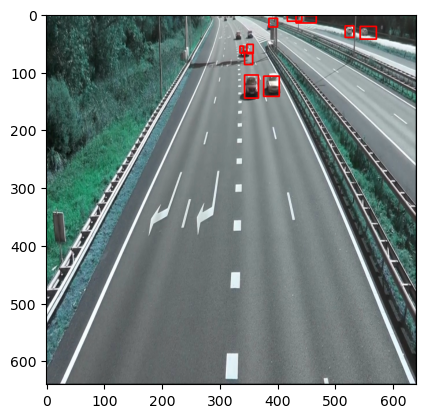

Detected objects:
(512, 19), (528, 40), score=0.41341838240623474, class=3
(414, 0), (439, 12), score=0.37596142292022705, class=3
(380, 115), (405, 146), score=0.33769840002059937, class=3
(344, 118), (368, 162), score=0.32558780908584595, class=3
(345, 114), (365, 147), score=0.2891772389411926, class=3
(349, 49), (358, 65), score=0.28691744804382324, class=3
(424, 1), (490, 16), score=0.2779378890991211, class=3
(550, 21), (572, 40), score=0.262606680393219, class=3
(501, 16), (515, 32), score=0.26008686423301697, class=3
(333, 53), (339, 67), score=0.2548624575138092, class=3
(392, 37), (400, 59), score=0.21274514496326447, class=3
(381, 118), (411, 156), score=0.20069552958011627, class=3
(390, 9), (402, 26), score=0.20064488053321838, class=3


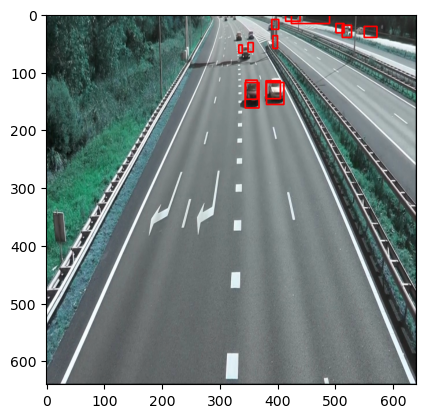

Detected objects:
(507, 19), (527, 39), score=0.5181305408477783, class=3
(498, 17), (515, 33), score=0.35152703523635864, class=3
(415, 1), (433, 14), score=0.26121068000793457, class=3
(547, 19), (582, 40), score=0.2276279628276825, class=3
(351, 48), (360, 63), score=0.2165316939353943, class=3
(423, 2), (493, 20), score=0.2130441814661026, class=3


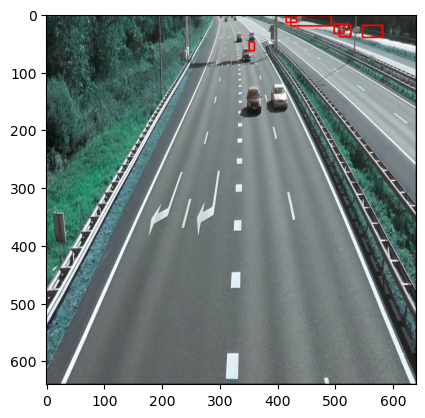

Detected objects:
(503, 16), (525, 35), score=0.5744380354881287, class=3
(500, 14), (513, 29), score=0.3578394651412964, class=3
(418, 0), (435, 11), score=0.261542946100235, class=3
(545, 17), (580, 38), score=0.20530402660369873, class=3
(330, 46), (337, 61), score=0.20439568161964417, class=3


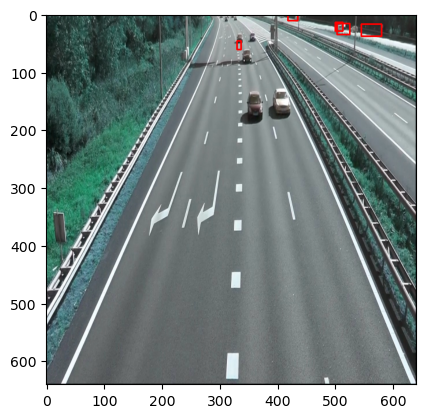

Detected objects:
(499, 15), (528, 34), score=0.5168088674545288, class=3
(494, 14), (513, 29), score=0.41645348072052, class=3
(417, 1), (434, 12), score=0.24808664619922638, class=3
(425, 3), (495, 17), score=0.21664413809776306, class=3
(330, 48), (336, 61), score=0.20960567891597748, class=3
(539, 13), (584, 38), score=0.2052682638168335, class=3
(353, 41), (362, 58), score=0.20148874819278717, class=3


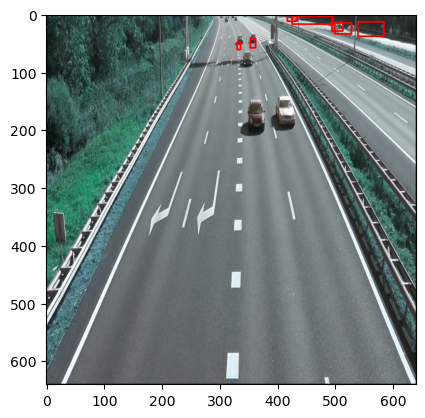

Detected objects:
(494, 14), (509, 28), score=0.42672720551490784, class=3
(505, 16), (525, 32), score=0.3916968107223511, class=3
(339, 70), (358, 93), score=0.2670086920261383, class=3
(400, 157), (437, 212), score=0.23127247393131256, class=3
(421, 1), (434, 12), score=0.2042313665151596, class=3


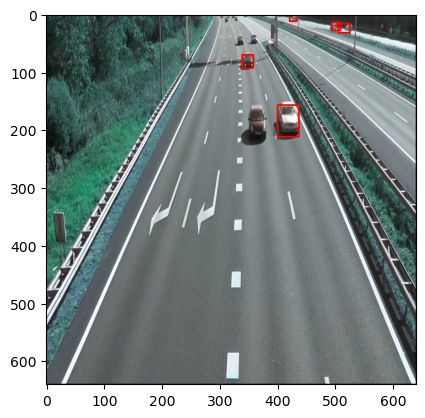

Detected objects:
(490, 14), (505, 26), score=0.42887169122695923, class=3
(405, 172), (450, 242), score=0.3444872200489044, class=3
(506, 16), (526, 30), score=0.3095460832118988, class=3
(420, 0), (432, 11), score=0.25405701994895935, class=3
(337, 78), (358, 99), score=0.22888435423374176, class=3
(450, 6), (481, 19), score=0.21683765947818756, class=3
(329, 48), (336, 64), score=0.2017233669757843, class=3


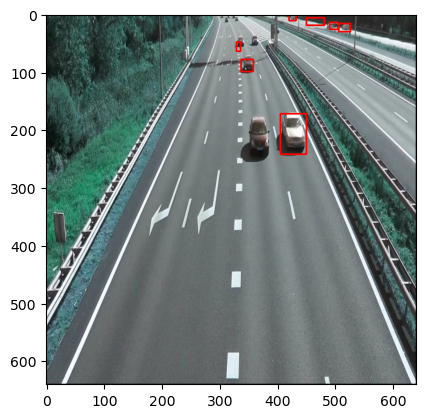

Detected objects:
(486, 11), (504, 22), score=0.4271097779273987, class=3
(507, 18), (526, 30), score=0.2765468657016754, class=3
(418, 0), (433, 10), score=0.2724640369415283, class=3
(340, 82), (360, 100), score=0.2510768473148346, class=3
(441, 5), (486, 18), score=0.24033039808273315, class=3
(354, 41), (365, 60), score=0.2296159416437149, class=3
(410, 183), (451, 265), score=0.21013006567955017, class=3


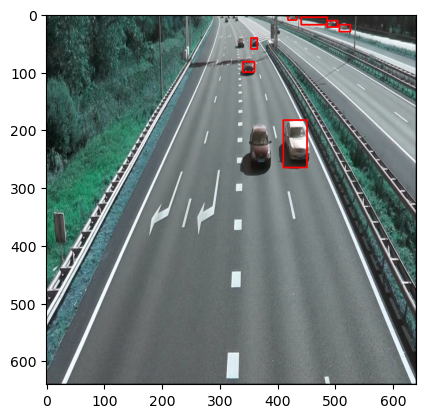

Detected objects:
(484, 9), (506, 22), score=0.4472881853580475, class=3
(342, 85), (361, 104), score=0.2876337766647339, class=3
(504, 15), (525, 27), score=0.2781912088394165, class=3
(447, 6), (480, 18), score=0.25694090127944946, class=3
(419, 3), (431, 13), score=0.22163578867912292, class=3
(418, 207), (466, 289), score=0.21487566828727722, class=3
(357, 43), (367, 61), score=0.21400275826454163, class=3


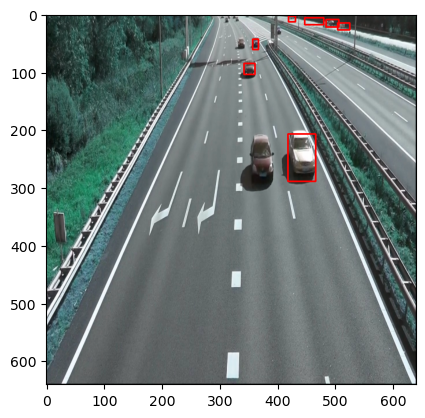

Detected objects:
(423, 230), (477, 326), score=0.4686232805252075, class=3
(482, 9), (502, 20), score=0.4407152533531189, class=3
(458, 8), (478, 19), score=0.3268130421638489, class=3
(511, 17), (528, 27), score=0.22054147720336914, class=3
(348, 231), (399, 327), score=0.21748605370521545, class=3
(343, 84), (362, 103), score=0.20430777966976166, class=3
(0, 1), (640, 631), score=0.20345395803451538, class=3


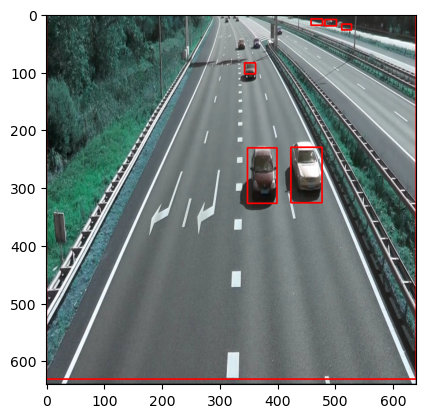

Detected objects:
(431, 238), (480, 340), score=0.43546661734580994, class=3
(480, 9), (502, 20), score=0.38633888959884644, class=3
(445, 6), (480, 17), score=0.3220699727535248, class=3
(343, 86), (361, 103), score=0.25479158759117126, class=3
(424, 199), (487, 341), score=0.24114222824573517, class=3
(414, 5), (431, 15), score=0.21335944533348083, class=3
(433, 235), (474, 295), score=0.20251622796058655, class=3
(356, 49), (365, 65), score=0.20002011954784393, class=3


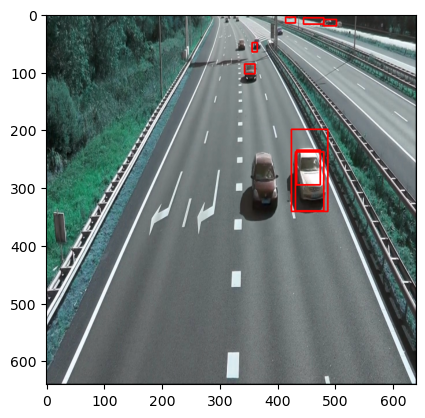

Detected objects:
(479, 8), (501, 20), score=0.3622865676879883, class=3
(448, 7), (478, 18), score=0.3392276167869568, class=3
(339, 96), (365, 127), score=0.23874782025814056, class=3
(354, 50), (366, 68), score=0.22735030949115753, class=3
(330, 51), (339, 70), score=0.21493802964687347, class=3
(430, 255), (495, 377), score=0.21472527086734772, class=3
(1, 0), (632, 640), score=0.21411262452602386, class=3
(412, 5), (430, 15), score=0.20760199427604675, class=3
(345, 80), (362, 101), score=0.20074360072612762, class=3


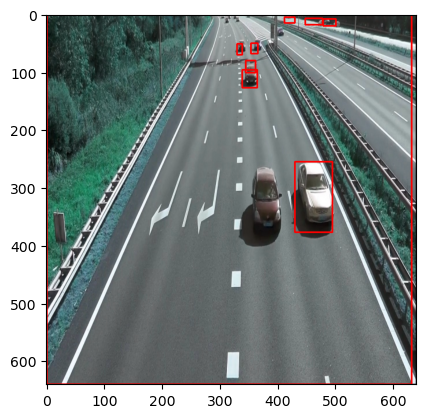

Detected objects:
(339, 102), (366, 134), score=0.3864736258983612, class=3
(442, 281), (509, 429), score=0.3698822855949402, class=3
(445, 4), (477, 16), score=0.36175736784935, class=3
(472, 6), (499, 18), score=0.35275518894195557, class=3
(356, 51), (367, 69), score=0.3168066442012787, class=3
(453, 332), (512, 425), score=0.28626102209091187, class=3
(329, 54), (337, 71), score=0.2686186730861664, class=3
(411, 6), (426, 17), score=0.2587742209434509, class=3
(345, 75), (365, 97), score=0.2505449652671814, class=3
(394, 32), (403, 55), score=0.2179505079984665, class=3
(346, 295), (411, 441), score=0.20246362686157227, class=3


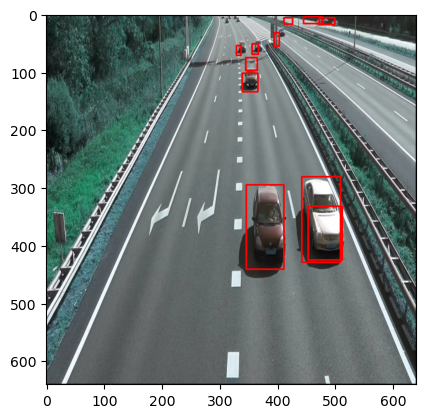

Detected objects:
(453, 304), (521, 445), score=0.5686324238777161, class=3
(341, 102), (367, 135), score=0.41730132699012756, class=3
(446, 4), (476, 16), score=0.3654497265815735, class=3
(475, 6), (497, 18), score=0.33861514925956726, class=3
(356, 51), (368, 70), score=0.2763341963291168, class=3
(328, 54), (337, 71), score=0.24998806416988373, class=3
(411, 7), (426, 18), score=0.2439594864845276, class=3
(346, 74), (365, 99), score=0.2285119593143463, class=3
(393, 35), (402, 57), score=0.20270192623138428, class=3
(344, 319), (413, 479), score=0.20212684571743011, class=3


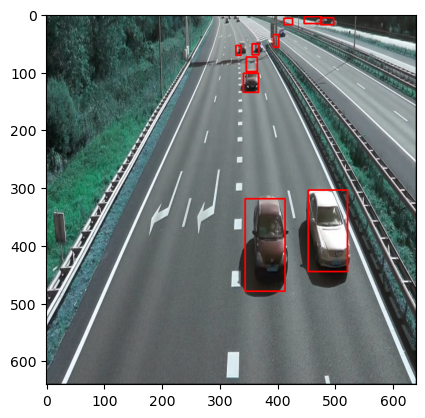

Detected objects:
(463, 338), (544, 514), score=0.525104284286499, class=3
(443, 2), (479, 13), score=0.4311777353286743, class=3
(339, 106), (372, 144), score=0.42046552896499634, class=3
(467, 2), (497, 14), score=0.3548923134803772, class=3
(356, 51), (368, 74), score=0.3220631778240204, class=3
(411, 8), (424, 19), score=0.2857263386249542, class=3
(327, 53), (336, 72), score=0.25891217589378357, class=3
(389, 37), (399, 60), score=0.25435036420822144, class=3
(355, 353), (428, 532), score=0.2455843836069107, class=3
(348, 63), (368, 98), score=0.22926512360572815, class=3


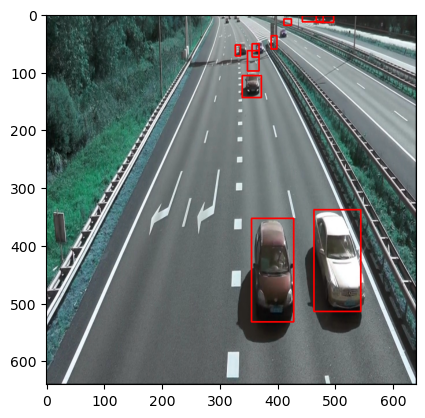

Detected objects:
(479, 378), (580, 620), score=0.5308597683906555, class=3
(449, 1), (478, 13), score=0.4556451141834259, class=3
(342, 106), (374, 144), score=0.37816113233566284, class=3
(392, 22), (637, 608), score=0.3317747116088867, class=3
(465, 2), (493, 15), score=0.3111201226711273, class=3
(412, 13), (423, 25), score=0.2975354790687561, class=3
(356, 50), (369, 75), score=0.2826750874519348, class=3
(382, 41), (394, 66), score=0.25547850131988525, class=3
(363, 418), (437, 613), score=0.23809874057769775, class=3
(350, 57), (370, 92), score=0.22147653996944427, class=3
(327, 53), (337, 73), score=0.2184145599603653, class=3
(409, 30), (423, 55), score=0.20833584666252136, class=3
(349, 481), (440, 625), score=0.20509091019630432, class=3


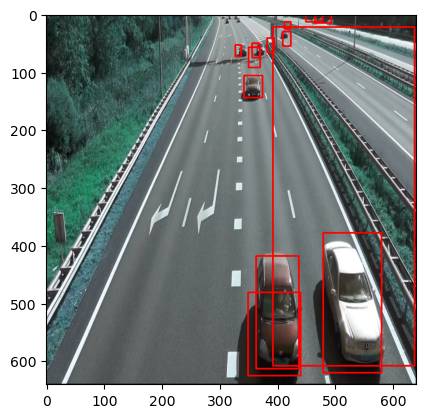

Detected objects:
(447, 1), (475, 12), score=0.5219320058822632, class=3
(483, 420), (597, 638), score=0.3965810239315033, class=3
(412, 10), (427, 22), score=0.3458211123943329, class=3
(466, 3), (494, 14), score=0.31016305088996887, class=3
(341, 102), (374, 146), score=0.306647926568985, class=3
(378, 26), (639, 611), score=0.2845214009284973, class=3
(357, 49), (370, 75), score=0.27050334215164185, class=3
(379, 42), (392, 66), score=0.26809102296829224, class=3
(328, 53), (336, 73), score=0.21420280635356903, class=3
(408, 31), (423, 56), score=0.21237696707248688, class=3


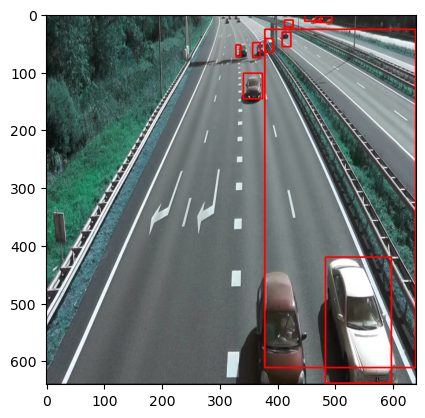

Detected objects:
(448, 1), (473, 12), score=0.5546585917472839, class=3
(412, 14), (426, 26), score=0.38802069425582886, class=3
(466, 3), (495, 14), score=0.34067389369010925, class=3
(490, 502), (634, 635), score=0.33229467272758484, class=3
(380, 44), (393, 68), score=0.303312748670578, class=3
(360, 50), (372, 76), score=0.2979154586791992, class=3
(408, 31), (424, 55), score=0.27466338872909546, class=3
(353, 55), (368, 84), score=0.25732922554016113, class=3
(345, 108), (373, 149), score=0.2364322990179062, class=3
(326, 55), (333, 74), score=0.21115249395370483, class=3
(0, 15), (632, 635), score=0.20761631429195404, class=3
(370, 533), (461, 639), score=0.20053261518478394, class=3


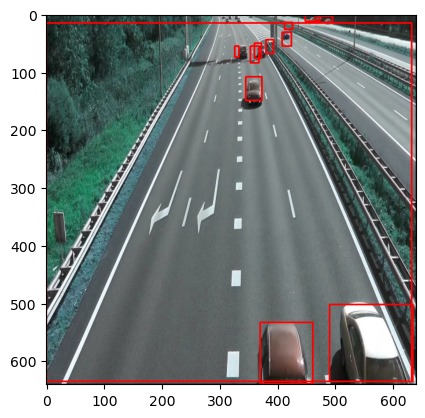

Detected objects:
(448, 0), (473, 11), score=0.5017154812812805, class=3
(413, 16), (426, 29), score=0.3264813721179962, class=3
(359, 54), (369, 75), score=0.29674452543258667, class=3
(539, 607), (628, 639), score=0.2827880382537842, class=3
(466, 2), (494, 13), score=0.2729802429676056, class=3
(350, 58), (366, 85), score=0.2420177012681961, class=3
(384, 40), (396, 65), score=0.24020256102085114, class=3
(407, 29), (424, 55), score=0.2354656457901001, class=3


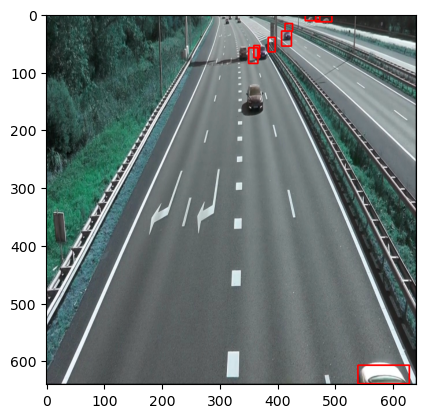

Detected objects:
(452, 0), (474, 10), score=0.48159196972846985, class=3
(416, 17), (427, 28), score=0.32962220907211304, class=3
(361, 55), (371, 76), score=0.3289162516593933, class=3
(379, 45), (391, 69), score=0.29121479392051697, class=3
(466, 2), (493, 13), score=0.2840123176574707, class=3
(351, 58), (367, 85), score=0.2512134909629822, class=3
(409, 31), (424, 54), score=0.24255472421646118, class=3
(326, 58), (333, 75), score=0.2222989797592163, class=3


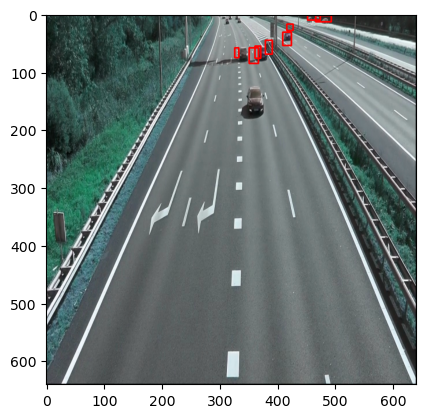

Detected objects:
(452, 0), (472, 10), score=0.47872358560562134, class=3
(419, 18), (430, 29), score=0.3244934678077698, class=3
(412, 32), (427, 52), score=0.264443039894104, class=3
(380, 46), (392, 69), score=0.2600118815898895, class=3
(364, 56), (373, 75), score=0.2297465205192566, class=3
(469, 3), (493, 14), score=0.22920875251293182, class=3
(348, 61), (364, 86), score=0.2140735536813736, class=3


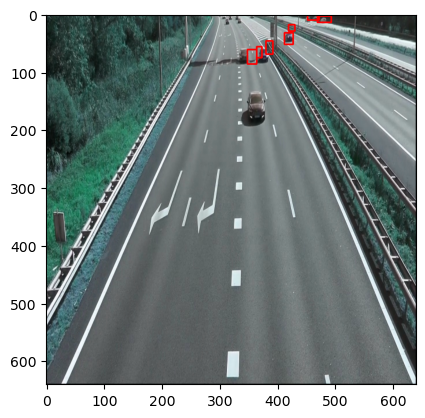

Detected objects:
(450, 0), (470, 12), score=0.524092435836792, class=3
(422, 17), (434, 28), score=0.3810679614543915, class=3
(411, 33), (428, 54), score=0.3413873314857483, class=3
(381, 46), (394, 68), score=0.26983878016471863, class=3
(360, 58), (368, 74), score=0.21519653499126434, class=3


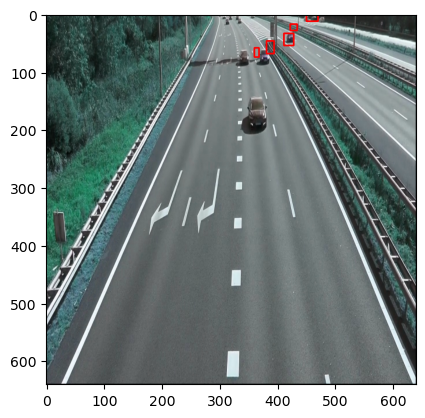

Detected objects:
(451, 0), (470, 11), score=0.46716001629829407, class=3
(421, 16), (432, 27), score=0.32020705938339233, class=3
(414, 33), (428, 53), score=0.2897433042526245, class=3
(382, 48), (394, 70), score=0.24243606626987457, class=3


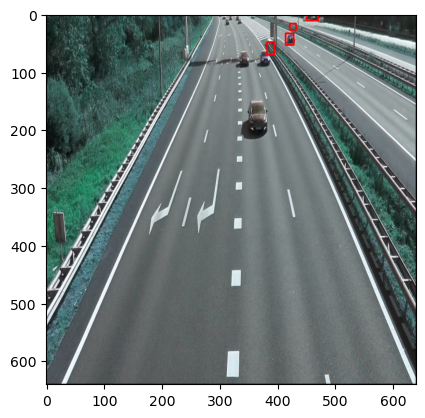

Detected objects:
(450, 0), (468, 12), score=0.4504612386226654, class=3
(423, 15), (434, 26), score=0.3277292847633362, class=3
(416, 35), (430, 55), score=0.31052565574645996, class=3
(385, 45), (395, 65), score=0.24958716332912445, class=3
(376, 70), (393, 93), score=0.21171222627162933, class=3


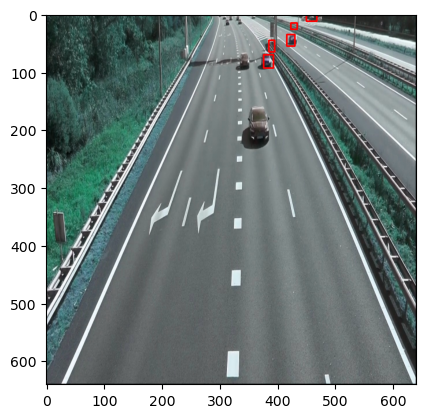

Detected objects:
(446, 0), (467, 12), score=0.47448742389678955, class=3
(419, 36), (434, 56), score=0.3866555094718933, class=3
(426, 13), (437, 25), score=0.32936060428619385, class=3
(378, 76), (394, 96), score=0.3200289309024811, class=3
(388, 43), (397, 61), score=0.2299644649028778, class=3
(357, 78), (369, 97), score=0.22718918323516846, class=3


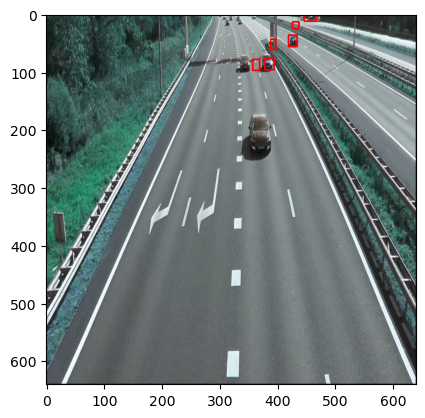

Detected objects:
(448, 0), (467, 12), score=0.4614938795566559, class=3
(419, 38), (435, 59), score=0.3753809630870819, class=3
(427, 13), (439, 25), score=0.33142825961112976, class=3
(380, 77), (395, 95), score=0.30453187227249146, class=3
(395, 42), (404, 60), score=0.2169649302959442, class=3
(352, 81), (364, 98), score=0.20012429356575012, class=3


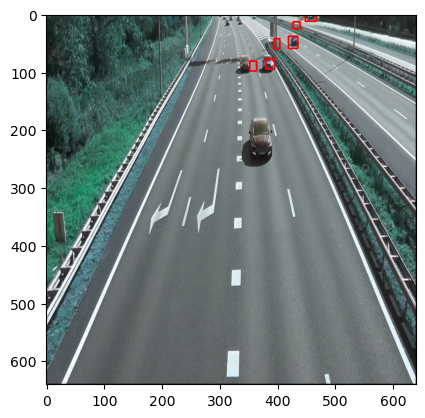

Detected objects:
(442, 0), (464, 12), score=0.4049808382987976, class=3
(420, 42), (438, 62), score=0.3792631924152374, class=3
(426, 9), (438, 22), score=0.28728991746902466, class=3
(380, 80), (396, 104), score=0.2711414098739624, class=3


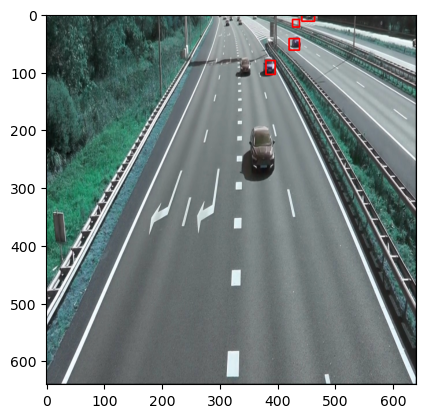

Detected objects:
(442, 0), (460, 12), score=0.3569812774658203, class=3
(426, 45), (440, 65), score=0.33620142936706543, class=3
(626, 36), (638, 61), score=0.334512859582901, class=3
(427, 7), (439, 20), score=0.32504788041114807, class=3
(379, 81), (396, 107), score=0.2210778295993805, class=3
(344, 85), (358, 107), score=0.20211735367774963, class=3


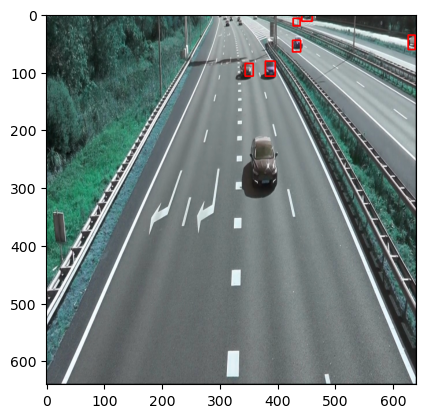

Detected objects:
(620, 37), (639, 63), score=0.48145461082458496, class=3
(426, 44), (445, 68), score=0.33822229504585266, class=3
(426, 7), (440, 20), score=0.336009681224823, class=3
(378, 83), (396, 107), score=0.3326530158519745, class=3
(441, 0), (461, 12), score=0.31138598918914795, class=3
(339, 85), (357, 109), score=0.2877994477748871, class=3
(433, 44), (452, 63), score=0.21516460180282593, class=3
(576, 34), (614, 55), score=0.202253058552742, class=3


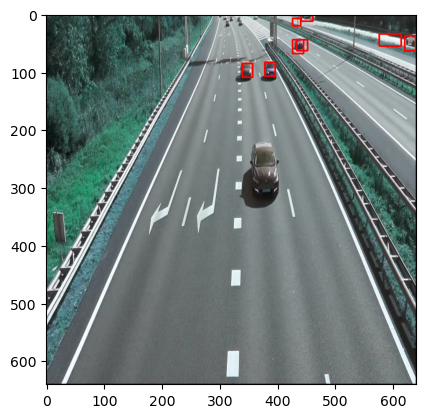

Detected objects:
(616, 34), (638, 60), score=0.5006159543991089, class=3
(428, 43), (449, 69), score=0.32174378633499146, class=3
(426, 5), (441, 18), score=0.2705027163028717, class=3
(431, 45), (452, 66), score=0.2664678990840912, class=3
(382, 81), (398, 107), score=0.24192370474338531, class=3
(619, 23), (636, 43), score=0.24109101295471191, class=3
(439, 0), (460, 13), score=0.2220575213432312, class=3
(583, 33), (614, 56), score=0.22193685173988342, class=3
(379, 93), (403, 120), score=0.21195891499519348, class=3
(334, 93), (359, 125), score=0.20848870277404785, class=3


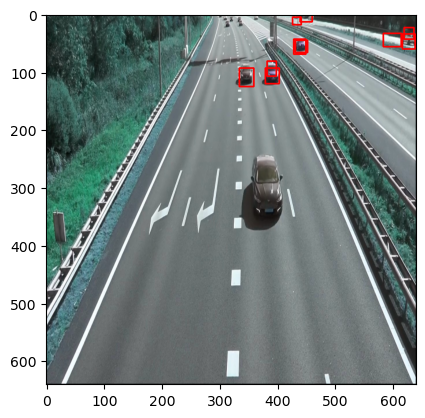

Detected objects:
(614, 31), (636, 59), score=0.5087514519691467, class=3
(429, 40), (449, 71), score=0.29520106315612793, class=3
(379, 93), (404, 124), score=0.27576813101768494, class=3
(592, 31), (615, 53), score=0.264779657125473, class=3
(426, 4), (438, 17), score=0.2520717978477478, class=3
(615, 19), (635, 46), score=0.2467987835407257, class=3
(433, 44), (452, 67), score=0.2248382717370987, class=3
(594, 23), (604, 41), score=0.22251084446907043, class=3
(382, 78), (400, 110), score=0.21885527670383453, class=3
(334, 98), (359, 129), score=0.21375922858715057, class=3


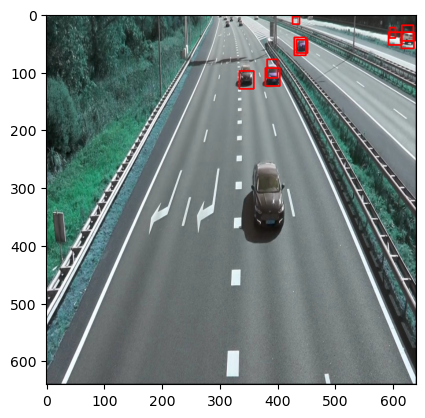

Detected objects:
(613, 33), (633, 59), score=0.44048139452934265, class=3
(339, 274), (425, 414), score=0.3640425205230713, class=3
(430, 42), (450, 72), score=0.30128178000450134, class=3
(593, 34), (614, 55), score=0.2826872169971466, class=3
(425, 4), (439, 17), score=0.2589186429977417, class=3
(434, 45), (454, 68), score=0.25028687715530396, class=3
(617, 23), (632, 44), score=0.2113577276468277, class=3
(381, 99), (404, 127), score=0.20942801237106323, class=3


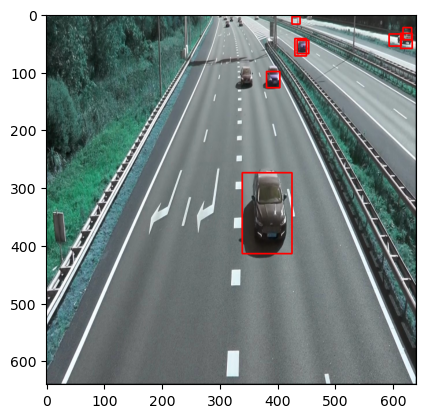

Detected objects:
(613, 33), (633, 59), score=0.44021084904670715, class=3
(339, 274), (425, 414), score=0.3610728085041046, class=3
(430, 42), (450, 72), score=0.30422189831733704, class=3
(593, 34), (613, 55), score=0.286454975605011, class=3
(425, 4), (439, 16), score=0.26086845993995667, class=3
(434, 45), (454, 68), score=0.2535228729248047, class=3
(381, 99), (405, 127), score=0.21161000430583954, class=3
(616, 23), (631, 44), score=0.2085387259721756, class=3


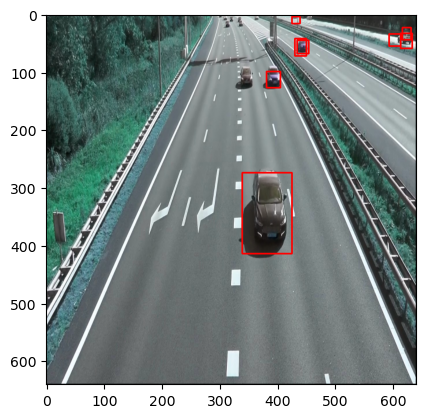

Detected objects:
(603, 30), (633, 59), score=0.5447177886962891, class=3
(340, 281), (427, 432), score=0.41443681716918945, class=3
(594, 33), (615, 53), score=0.4124278426170349, class=3
(592, 29), (604, 45), score=0.28661131858825684, class=3
(609, 22), (631, 45), score=0.28034543991088867, class=3
(434, 45), (456, 69), score=0.24914957582950592, class=3
(384, 100), (405, 130), score=0.23016230762004852, class=3
(333, 100), (358, 134), score=0.20412622392177582, class=3
(423, 3), (437, 15), score=0.20188432931900024, class=3


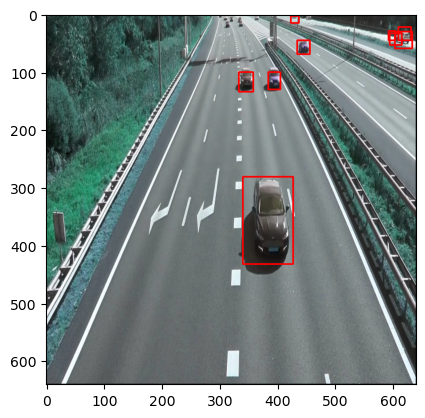

Detected objects:
(601, 28), (633, 59), score=0.5308241844177246, class=3
(596, 33), (614, 53), score=0.46082377433776855, class=3
(592, 27), (606, 44), score=0.3268183767795563, class=3
(609, 22), (631, 45), score=0.3098486661911011, class=3
(435, 46), (456, 70), score=0.25805333256721497, class=3
(345, 300), (427, 474), score=0.2549954354763031, class=3
(425, 2), (438, 13), score=0.22192327678203583, class=3
(384, 106), (405, 132), score=0.21366412937641144, class=3


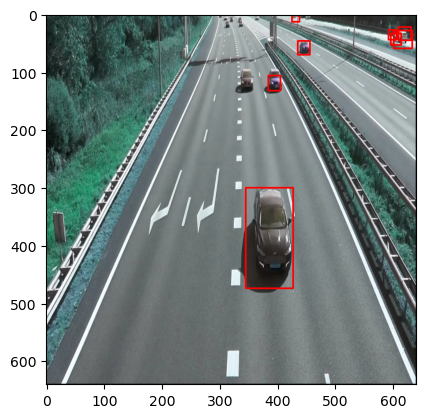

Detected objects:
(603, 30), (634, 58), score=0.5252791047096252, class=3
(595, 32), (614, 52), score=0.5056376457214355, class=3
(592, 26), (607, 45), score=0.3330923616886139, class=3
(355, 318), (432, 490), score=0.2996252477169037, class=3
(438, 49), (458, 73), score=0.29022684693336487, class=3
(436, 48), (452, 72), score=0.26357579231262207, class=3
(616, 24), (631, 44), score=0.2551572322845459, class=3
(425, 0), (439, 12), score=0.25044217705726624, class=3
(383, 108), (406, 140), score=0.21980693936347961, class=3


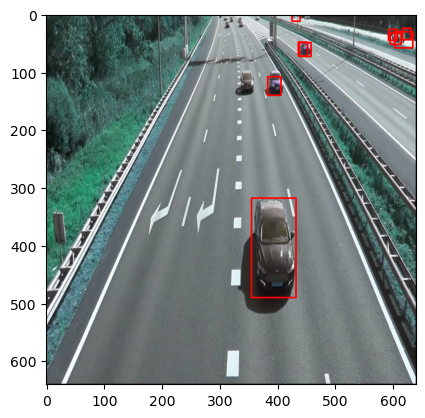

In [149]:
for video_frame in all_frames_paths:

    
    print_frame_and_bbox(video_frame)